In [1]:
import sys
sys.path.append("../../")

from astronn.datasets import deltascuti, bedding, corot ,starmodels
from astronn import models

import tensorflow as tf
from tensorflow import keras

import numpy as np
import math
import pandas as pd
import shap
from scipy.signal import find_peaks, peak_widths
import pickle

import matplotlib.pyplot as plt

Using TensorFlow backend.


### Some examples of star models

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the ver

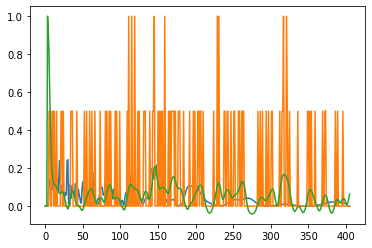

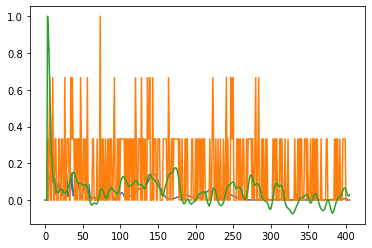

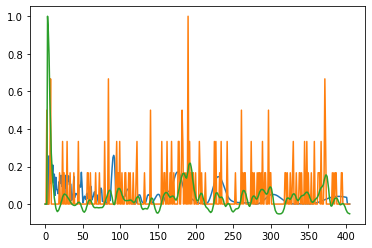

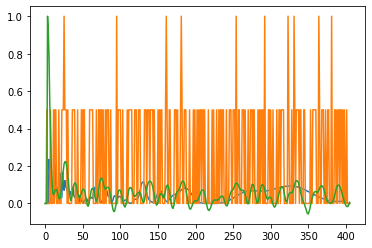

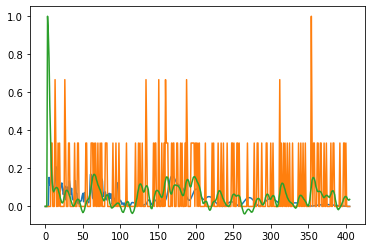

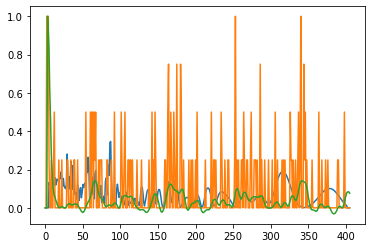

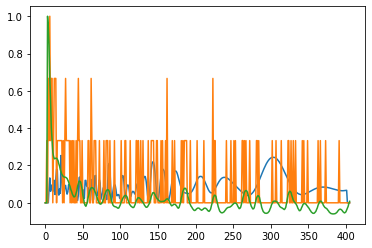

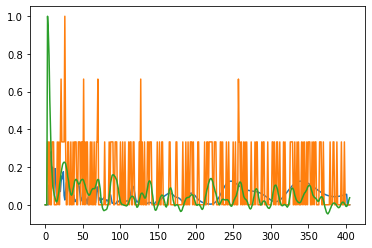

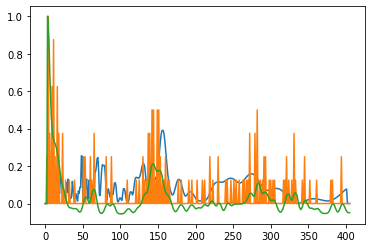

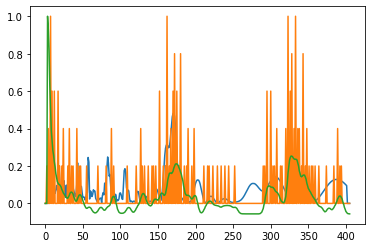

In [2]:
bedding_stars = bedding()
df_bedding = bedding_stars.load("../data/bedding/preprocessed/*", batch_size=1)
for star in df_bedding.take(10):
    #print(np.where(star[1]==1))
    plt.plot(star[1][0, :, 0])
    plt.plot(star[1][0, :, 1])
    plt.plot(star[1][0, :, 2])
    plt.show()

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set

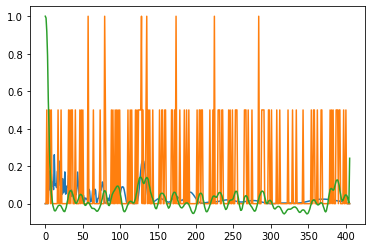

(array([0]), array([89]))


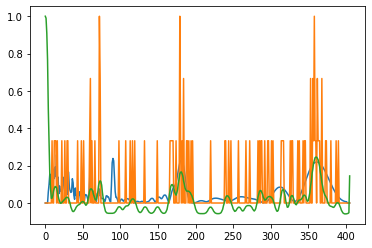

(array([0]), array([81]))


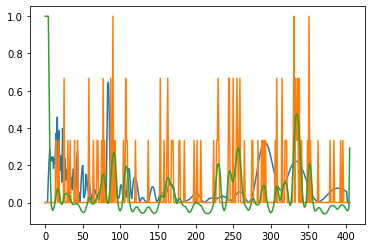

(array([0]), array([79]))


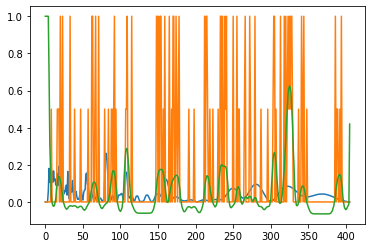

(array([0]), array([50]))


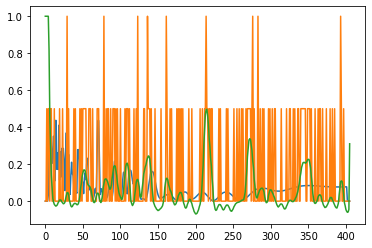

(array([0]), array([22]))


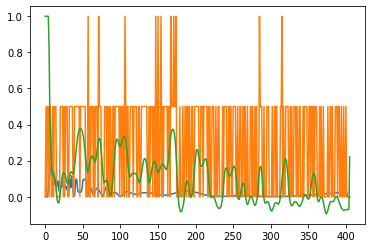

(array([0]), array([82]))


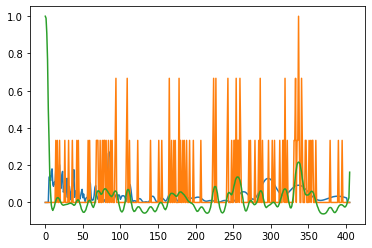

(array([0]), array([47]))


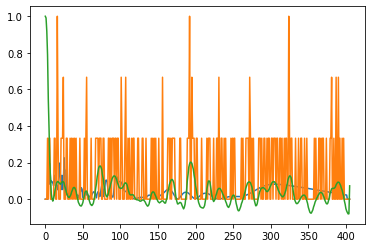

(array([0]), array([41]))


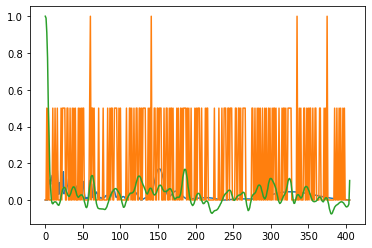

(array([0]), array([90]))


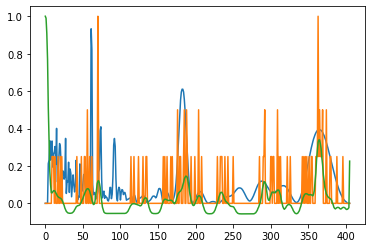

In [3]:
df = starmodels().load("/home/roberto/Downloads/dataall_parts/*", batch_size=1, add_noise=True)
for star in df.take(10):
    print(np.where(star[1]==1))
    plt.plot(star[0][0, :, 0])
    plt.plot(star[0][0, :, 1])
    plt.plot(star[0][0, :, 2])
    plt.show()

### The next Period-Luminosity relation is obtained by using the data provided in McNamara (2011):

$\log_{10} \text{L}_\odot = 1.4722 (0.100) \log_{10} \text{P} + 2.6089 (0.096)$

&nbsp;
&nbsp;


### Period (variable $\text{P}$) is isolated to obtained its value given the Luminosity.

$\log_{10} \text{L}_\odot - 2.6089 (0.096) = 1.4722 (0.100) \log_{10} \text{P}$

$\log_{10} \text{P} = \Large\frac{\log_{10} \text{L}_\odot - 2.6089 (0.096)}{1.4722 (0.100)}$

$\text{P} = 10\Large^{\Large\frac{\log_{10} \text{L}_\odot - 2.6089 (0.096)}{1.4722 (0.100)}}$

&nbsp;

The fundamental radial mode $\text{P}_0$ is related to the mean density by the pulsation constant $\text{Q} = \text{P} \cdot \Large\sqrt{\frac{\rho}{\rho_\odot}}$ (see Breger, 1990). For $\text{P}_0$ the value of $\text{Q} = [0.03, 0.0492] \text{ (days)}$

Thus, by isolating $\frac{\rho}{\rho_\odot}$ in the above equation and given the value of $\text{P}$, we have a direct estimation of the mean density, as follows:

&nbsp;

$\Large\frac{\rho}{\rho_\odot} = \Big( \frac{Q}{P}\Big)^2$

In [4]:
def get_log_l(P, A=1.4722, e_A=0.1, B=2.6089, e_B=0.096):
    """
    P-L relation for McNamara (2011)
    """
    return A * np.log10(P) + B


def get_P(log_L, A=1.4722, e_A=0.1, B=2.6089, e_B=0.096):
    """
    P variable isolated from log_L relation
    """
    return np.power(10, (log_L - B) / (A))

def get_rho_from_P(P, Q=0.033):
    """
    """
    return np.power(Q/P, 2)

# Example
P = 2.34
log_l = get_log_l(P=P)
P_equation = get_P(log_L=log_l)
print("P value = %f" % P)
print("log L is equal to %f" % log_l)
print("P from equation %f" % P_equation)
# Assert results
np.testing.assert_almost_equal(P, P_equation)

P value = 2.340000
log L is equal to 3.152460
P from equation 2.340000


### Relate to the error, we use a standard error propagation to calculate it:

$\Delta P = \sqrt{\Big(\frac{\delta \text{P}}{\delta \text{A}}\Delta\text{A}\Big)^2  +  \Big(\frac{\delta \text{P}}{\delta \text{B}}\Delta\text{B}\Big)^2   +    \Big(\frac{\delta \text{P}}{\delta \text{L}}\Delta\text{L}\Big)^2}$ where $A = 1.4722$ with uncertainty $\Delta A = 0.100$ and $B = 2.6089$ with uncertainty $\Delta B = 0.096$

$\Delta P = \sqrt{ \Big( 10^{\frac{\text{L}_\odot - B}{A}}  * (2.30258509 * A^2) * \text{L}_\odot * \Delta A \Big)^2 + \Big( 10^{\frac{\text{L}_\odot - B}{A}}  * (2.30258509 * A) *  \Delta B \Big)^2}$


&nbsp;

## Range of $\rho$ used through PL relation

To calculate a valid PL window, we will use the next range:

$\Large[ \frac{\rho}{\rho_\odot}_{\min} = \Big( \frac{0.033}{P+\Delta_p}\Big)^2, \frac{\rho}{\rho_\odot}_{\max} = \Big( \frac{0.042}{P-\Delta_p}\Big)^2 \Large]$

In [5]:
def p_error(log_L, A=1.4722, e_A=0.1, B=2.6089, e_B=0.096):
    """
    """
    return np.sqrt(
        np.power(
            np.power(10, (log_L - B) / A) * (2.30258509 / np.power(A, 2)) * log_L * e_A,
            2,
        )
        + np.power(np.power(10, (log_L - B) / A) * (2.30258509 / A) * e_B, 2)
    )


l_value = 1.3
print(
    "Period for L=%f is equal to %f +-(%f)"
    % (l_value, get_P(log_L=1.3), p_error(log_L=1.3))
)

Period for L=1.300000 is equal to 0.129099 +-(0.026337)


### Relation Rodriguez-Martin et.al. 2020

$\frac{\bar{\rho}}{\rho} = 1.6^{+0.5}_{-0.4} \Big( \langle\Delta\nu\rangle / \Delta\nu_\odot \Big)^{2.02^{+0.10}_{-0.10}}$

For the moment, we will use a simetric error in the first term i.e.: $1.6^{+0.5}_{-0.5}$

$\Delta \frac{\bar{\rho}}{\rho} = \sqrt{\Big(\frac{\delta \frac{\bar{\rho}}{\rho}}{\delta \text{A}}\Delta\text{A}\Big)^2  +  \Big(\frac{\delta \frac{\bar{\rho}}{\rho}}{\delta \text{B}}\Delta\text{B}\Big)^2 }$ where $A = 1.6$ with uncertainty $\Delta A = 0.5$ and $B = 2.02$ with uncertainty $\Delta B = 0.1$

$\Delta \frac{\bar{\rho}}{\rho}  = \sqrt{ ( {\langle\Delta\nu\rangle / \Delta\nu_\odot} )^B * \Delta \text{A} )^2 +  (A * ( {\langle\Delta\nu\rangle / \Delta\nu_\odot} )^B + \log_{10}(x) * \Delta B)^2 }$


&nbsp;
&nbsp;

Inversely, we can get $\Delta \nu$ from $\rho$ as follows:

$\langle\Delta\nu\rangle / \Delta\nu_\odot = \Big( \frac{\frac{\bar{\rho}}{\rho}}{1.6^{+0.5}_{-0.4}} \Big)^{\big(2.02^{+0.10}_{-0.10} \big)^{-1}}$

$\langle\Delta\nu\rangle / \Delta\nu_\odot = \sqrt{\Big(\frac{\delta \langle\Delta\nu\rangle / \Delta\nu_\odot}{\delta \text{A}}\Delta\text{A}\Big)^2  +  \Big(\frac{\delta \langle\Delta\nu\rangle / \Delta\nu_\odot}{\delta \text{B}}\Delta\text{B}\Big)^2 }$ where $A = 1.6$ with uncertainty $\Delta A = 0.5$ and $B = 2.02$ with uncertainty $\Delta B = 0.1$

$\langle\Delta\nu\rangle / \Delta\nu_\odot = \sqrt{  -(Y * 1/(\ln(B) * Y/A) * \Delta A)^2 + (-\log(Y/A)*1/B/\ln(B)^2 * \Delta B)^2 }$



In [6]:
def get_rho(delta_nu):
    """
    """
    return 1.6 * np.power(delta_nu, 2.02)


def rho_error(delta_nu, A=1.6, e_A=0.5, B=2.02, e_B=0.1):
    """
    """
    return np.sqrt(
        np.power(np.power(delta_nu, B) * e_A, 2) 
        + np.power(A * np.power(delta_nu, B) * np.log10(delta_nu) * e_B, 2)
    )

delta_nu_value = 1.3
print(
    "Delta_nu == %f is a rho equal to %f +-(%f)"
    % (l_value, get_rho(delta_nu=delta_nu_value), rho_error(delta_nu=delta_nu_value))
)

Delta_nu == 1.300000 is a rho equal to 2.718226 +-(0.850010)


In [7]:
def get_dnu_from_rho(rho):
    """
    """
    return math.pow(rho / 1.6, math.pow(2.02, -1))


def dnu_error(rho, A=1.6, e_A=0.0, B=2.02, e_B=0.1):
    """
    """
    return np.sqrt(
        math.pow(
            -math.pow(rho / A, 1 / B - 1) * (1 / B / math.pow(A, 2)) * rho * e_A, 2
        )
        + math.pow(
            -math.pow(rho / A, 1 / B)
            / math.pow(B, 2)
            * math.log(rho / A, math.e)
            * e_B,
            2,
        )
    )

rho = 2.718226
print(
    "rho == %f is a Delta_nu equal to %f +-(%f)"
    % (rho, get_dnu_from_rho(rho=rho), dnu_error(rho=rho))
)

# Assert results
np.testing.assert_almost_equal(get_dnu_from_rho(rho=rho), delta_nu_value)

rho == 2.718226 is a Delta_nu equal to 1.300000 +-(0.016885)


In [8]:
def abline(slope, intercept):
    """Plot a line from slope and intercept"""
    axes = plt.gca()
    x_vals = np.array(axes.get_xlim())
    y_vals = intercept + slope * x_vals
    plt.plot(x_vals, y_vals, '--', label="x "+str(slope))

#### Load pre-trained NN model

In [9]:
# Load model
#sepconv_mod = tf.keras.models.load_model("/home/roberto/Projects/sepconvnn_tmp_400/")
#sepconv_mod = tf.keras.models.load_model("/home/roberto/Projects/sepconvnn_tmp_400_2/")
sepconv_mod = tf.keras.models.load_model("/tmp/sepconvnn_tmp_200/")
sepconv_mod.summary() 

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
separable_conv1d (SeparableC (None, 392, 10)           385       
_________________________________________________________________
separable_conv1d_1 (Separabl (None, 383, 10)           1010      
_________________________________________________________________
separable_conv1d_2 (Separabl (None, 379, 10)           760       
_________________________________________________________________
batch_normalization (BatchNo (None, 379, 10)           40        
_________________________________________________________________
max_pooling1d (MaxPooling1D) (None, 189, 10)           0         
_________________________________________________________________
dropout (Dropout)            (None, 189, 10)           0         
_________________________________________________________________
flatten (Flatten)            (None, 1890)              0

## Read an process 11 binaries DS

##### Calculate Luminosity

In [10]:
csv_ds = pd.read_csv("../data/deltascuti/binaries_obs.csv")
print(csv_ds.head(20))

# 1 mas = 0.00099999995874704 arcsec
Mv = csv_ds["mv"] + 5 * (np.log10(csv_ds["parallax"] * 0.00099999995874704) + 1)
mbolsun = 4.74
# calculate Luminosity
csv_ds["L"] = (np.power(10, 0.4 * (mbolsun - Mv))) * csv_ds["L.Ltot"]

# Filter columns and add HD15082 info300
csv_ds = csv_ds[["ID", "Dnu_muHz", "L", "Teff", "L.Ltot", "parallax", "mv"]]
csv_ds.loc[csv_ds['ID'] == "HD15082", ['L']] = 6.14
csv_ds.loc[csv_ds['ID'] == "HD15082", ['Dnu_muHz']] = 80
# Updated CID100866999 with Gaia Luminosity
csv_ds.loc[csv_ds['ID'] == "CID100866999", ['L']] = 3.865

csv_ds.head(11)
#csv_ds.to_csv("../data/deltascuti/binaries_obs.csv", index=False, header=True)

              ID  Dnu_muHz          L  Teff  L.Ltot  parallax       mv
0     KIC3858884        29  21.520774  6606   0.470    1.7800   9.3360
1     KIC4544587        74   6.475306  7750   0.332    1.3600  10.8470
2    KIC10661783        39  29.304625  7764   0.937    1.9400   9.5630
3       HD172189        19  29.942319  7750   0.702    2.2700   8.8850
4   CID100866999        56   3.865000  7300     NaN    0.5654  15.0970
5   CID105906206        20   9.396579  6750   0.940    0.9901  12.2620
6       HD159561        38  24.642612  8047   1.000   67.1300   2.1262
7     KIC9851944        26  60.062351  6902   0.500    0.4100  11.4770
8     KIC8262223        77   5.139949  9128   0.900    0.9832  12.8850
9    KIC10080943        52   7.085301  7480   0.500    1.0600  11.7350
10       HD15082        80   6.140000     0   0.000    0.0000   0.0000


,ID,Dnu_muHz,L,Teff,L.Ltot,parallax,mv
0,KIC3858884,29,21.520774,6606,0.470,1.7800,9.3360
1,KIC4544587,74,6.475306,7750,0.332,1.3600,10.8470
2,KIC10661783,39,29.304625,7764,0.937,1.9400,9.5630
3,HD172189,19,29.942319,7750,0.702,2.2700,8.8850
4,CID100866999,56,3.865000,7300,NaN,0.5654,15.0970
5,CID105906206,20,9.396579,6750,0.940,0.9901,12.2620
6,HD159561,38,24.642612,8047,1.000,67.1300,2.1262
7,KIC9851944,26,60.062351,6902,0.500,0.4100,11.4770
8,KIC8262223,77,5.139949,9128,0.900,0.9832,12.8850
9,KIC10080943,52,7.085301,7480,0.500,1.0600,11.7350


In [11]:
for l_value in csv_ds["L"]:
    print(
    "Period for L=%f is equal to %f +-(%f)"
    % (l_value, get_P(log_L=np.log10(l_value)), p_error(log_L=np.log10(l_value)))
    )

Period for L=21.520774 is equal to 0.135907 +-(0.028049)
Period for L=6.475306 is equal to 0.060110 +-(0.010407)
Period for L=29.304625 is equal to 0.167616 +-(0.036273)
Period for L=29.942319 is equal to 0.170085 +-(0.036929)
Period for L=3.865000 is equal to 0.042336 +-(0.006883)
Period for L=9.396579 is equal to 0.077408 +-(0.014111)
Period for L=24.642612 is equal to 0.149005 +-(0.031399)
Period for L=60.062351 is equal to 0.272908 +-(0.065866)
Period for L=5.139949 is equal to 0.051382 +-(0.008636)
Period for L=7.085301 is equal to 0.063900 +-(0.011197)
Period for L=6.140000 is equal to 0.057977 +-(0.009967)


In [12]:
# Load Teff,Dnu -> L model from star models
with open("../models/gam_teff_dnu/gam.pkl", 'rb') as f:
    gam_teff_dnu = pickle.load(f)
gam_teff_dnu.summary()

LinearGAM                                                                                                 
=============================================== ==========================================================
Distribution:                        NormalDist Effective DoF:                                     84.6873
Link Function:                     IdentityLink Log Likelihood:                               -960654.4226
Number of Samples:                       494768 AIC:                                          1921480.2198
                                                AICc:                                         1921480.2499
                                                GCV:                                                2.2207
                                                Scale:                                                2.22
                                                Pseudo R-Squared:                                   0.9958
Feature Function                  Lam

In [13]:
def get_peak_width(position, peaks, peaks_width, peaks_sorted_by_prob):
    """
    """
    peak_id = np.where(probs == peaks_sorted_by_prob[position])[0][0]
    return (peak_id, peaks_width[0][np.where(peaks == peak_id)[0][0]])

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: module 'gast' has no attribute 'Constant'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the ver

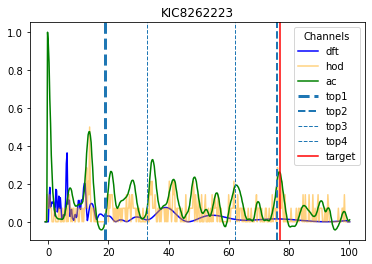

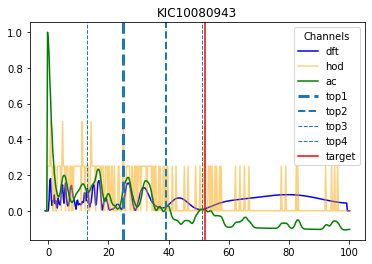

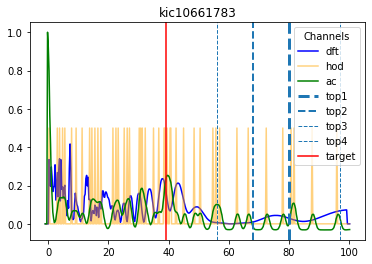

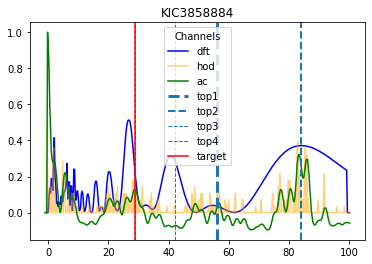

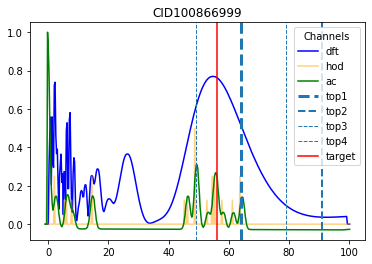

...

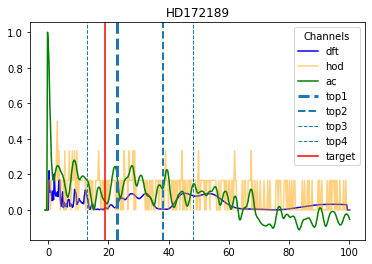

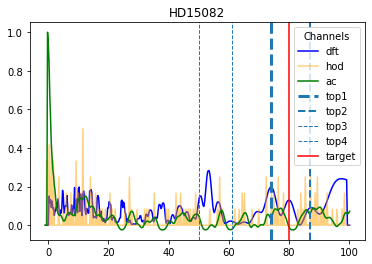

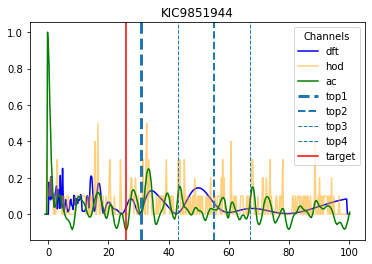

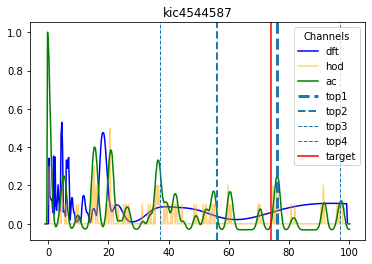

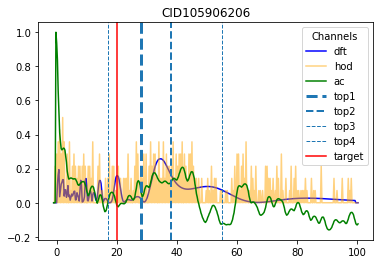

In [14]:
dnu_sun = 134.8

# Read datasets of preprocessed stars
df_ds = deltascuti()
df = df_ds.load("../../astronn/data/deltascuti/preprocessed/*", batch_size=1)
# Read star models (trainning) to calculate shap values
star_models = starmodels()
df_sm = star_models.load("/home/roberto/Downloads/dataall_parts/*", batch_size=150, add_noise=True)
#df_sm = star_models.load("/home/roberto/Downloads/evolutionTracks_line_noisy/parts/*", batch_size=150, add_noise=False)
#df_sm = star_models.load("/home/roberto/Downloads/evolutionTracks_line_lum/parts/*", batch_size=250, add_noise=False)
_train_shap = np.asarray([line[0].numpy() for line in df_sm.take(10)])
_train_shap = _train_shap.reshape(
    (
        _train_shap.shape[0] * _train_shap.shape[1],
        _train_shap.shape[2],
        _train_shap.shape[3],
    )
)

# Save results and predictions
results = {}
for star in df.take(11):  # take the 11 ds stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0]
    # Save results
    if star[0].numpy()[0].decode("utf-8") not in results:
        results[star[0].numpy()[0].decode("utf-8")] = {
            "dnu-target": target,
        }

    probs = sepconv_mod.predict_proba(star[1])[0]
    peaks, _ = find_peaks(probs, height=0, distance=10)
    peaks_width = peak_widths(probs, peaks)
    peaks_sorted_by_prob = np.sort(probs[peaks])[::-1]
    best_peak, best_peak_width = get_peak_width(0, peaks, peaks_width, peaks_sorted_by_prob)

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top1"] = np.where(
        probs == peaks_sorted_by_prob[0]
    )[0][0]
    # Get error
    results[star[0].numpy()[0].decode("utf-8")]["e-top1"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top2"] = np.where(
        probs == peaks_sorted_by_prob[1]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(1, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top2"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top3"] = np.where(
        probs == peaks_sorted_by_prob[2]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(2, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top3"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top4"] = np.where(
        probs == peaks_sorted_by_prob[3]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(3, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top4"] = best_peak_width


    # Get L from Teff,Dnu model
    L = csv_ds[csv_ds.ID.eq(star[0].numpy()[0].decode("utf-8").upper())]["L"].values
    Teff = csv_ds[csv_ds.ID.eq(star[0].numpy()[0].decode("utf-8").upper())][
        "Teff"
    ].values
    if len(L) > 0 and not np.isnan(L) and not np.isnan(Teff):
        l_teff_topk1 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top1"], Teff]
            ).reshape(1, 2)
        )[0]

        l_teff_topk2 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top2"], Teff]
            ).reshape(1, 2)
        )[0]
        l_teff_topk3 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top3"], Teff]
            ).reshape(1, 2)
        )[0]


        # Get L errors
        ls_teff_topks = [l_teff_topk1, l_teff_topk2, l_teff_topk3]
        # Get L errors
        errors = [
            round(np.power(l_teff_topk1 - L[0], 2), 2),
            round(np.power(l_teff_topk2 - L[0], 2), 2),
            round(np.power(l_teff_topk3 - L[0], 2), 2)
        ]
        i = np.argmin(errors)  # Get min error position
        L = ls_teff_topks[i]  # Get most probable L from the model

        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-up-fromstarmodel"
        ] = get_dnu_from_rho(rho_q_up) * dnu_sun
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-down-fromstarmodel"
        ] = get_dnu_from_rho(rho_q_down) * dnu_sun
    else:
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-up-fromstarmodel"
        ] = np.nan
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-down-fromstarmodel"
        ] = np.nan

    # Get P from L
    # Check for non L in csv or NaN value
    L = csv_ds[csv_ds.ID.eq(star[0].numpy()[0].decode("utf-8").upper())]["L"].values
    if len(L) > 0 and not np.isnan(L):
        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = get_dnu_from_rho(rho_q_up[0]) * dnu_sun
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-down"] = get_dnu_from_rho(rho_q_down[0]) * dnu_sun
    else:
        print(star[0].numpy()[0].decode("utf-8"))
        print(L)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = np.nan
        results[star[0].numpy()[0].decode("utf-8")]["v-from-P-down"] = np.nan

    if True:
        x = np.arange(-1, 100.5, 0.25)  # x axis from 0 to 100
        plt.plot(x, star[1][0, :, 0], label="dft", color="blue")
        plt.plot(x, star[1][0, :, 1], label="hod", color="orange", alpha=0.5)
        plt.plot(x, star[1][0, :, 2], label="ac", color="green")
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top1"], label="top1", linestyle="dashed", linewidth = 3)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top2"], label="top2", linestyle="dashed", linewidth = 2)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top3"], label="top3", linestyle="dashed", linewidth = 1)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top4"], label="top4", linestyle="dashed", linewidth = 1)
        plt.axvline(x=target, label="target", color="red")
        plt.title(star[0].numpy()[0].decode("utf-8"))
        plt.legend(title="Channels")
        plt.show()

In [15]:
df = pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "top1",
        "e-top1",
        "top2",
        "e-top2",
        "top3",
        "e-top3",
        "top4",
        "e-top4",
        "dnu-from-P-up-fromstarmodel",
        "dnu-from-P-down-fromstarmodel",
        "dnu-from-P-up",
        "dnu-from-P-down"

    ]
)
for i, id in enumerate(results):
    df.loc[i] = [
        id,
        results[id]["dnu-target"],
        results[id]["top1"],
        results[id]["e-top1"],
        results[id]["top2"],
        results[id]["e-top2"],
        results[id]["top3"],
        results[id]["e-top3"],
        results[id]["top4"],
        results[id]["e-top4"],
        results[id]["dnu-from-P-up-fromstarmodel"],
        results[id]["dnu-from-P-down-fromstarmodel"],
        results[id]["dnu-from-P-up"],
        results[id]["dnu-from-P-down"]
    ]
df

,id,dnu-target,top1,e-top1,top2,e-top2,top3,e-top3,top4,e-top4,dnu-from-P-up-fromstarmodel,dnu-from-P-down-fromstarmodel,dnu-from-P-up,dnu-from-P-down
0,KIC8262223,77,19,5.112992,76,1.599775,62,2.664029,33,2.212496,49.236846,26.030801,104.970838,59.080258
1,KIC10080943,52,25,5.526084,39,0.504423,51,1.214706,13,0.876047,61.269535,33.064872,85.316430,47.322315
2,kic10661783,39,80,1.737470,68,1.796580,97,1.135397,56,1.956704,65.443495,35.523959,34.545158,17.603175
3,KIC3858884,29,56,2.146569,84,1.343282,42,1.484172,29,2.594041,71.167851,38.908867,41.985046,21.843379
4,CID100866999,56,64,1.691264,91,1.871961,79,1.589146,49,1.153767,90.516244,50.426940,126.330451,71.900529
5,HD159561,38,33,2.396645,23,4.348769,51,1.112095,62,1.754304,33.368072,16.938660,38.537790,19.870672
6,HD172189,19,23,4.384972,38,0.814118,48,0.764642,13,0.734949,42.378977,22.069604,34.079468,17.340043
7,HD15082,80,74,3.087667,87,3.282916,61,2.711014,50,2.420170,70.290158,38.389033,93.569327,52.252186
8,KIC9851944,26,31,5.222055,55,1.956141,67,1.951387,43,4.116122,51.044574,27.081436,22.013591,10.647775
9,kic4544587,74,76,1.992955,56,1.349734,97,1.104726,37,1.936396,78.174951,43.068433,90.413084,50.365296


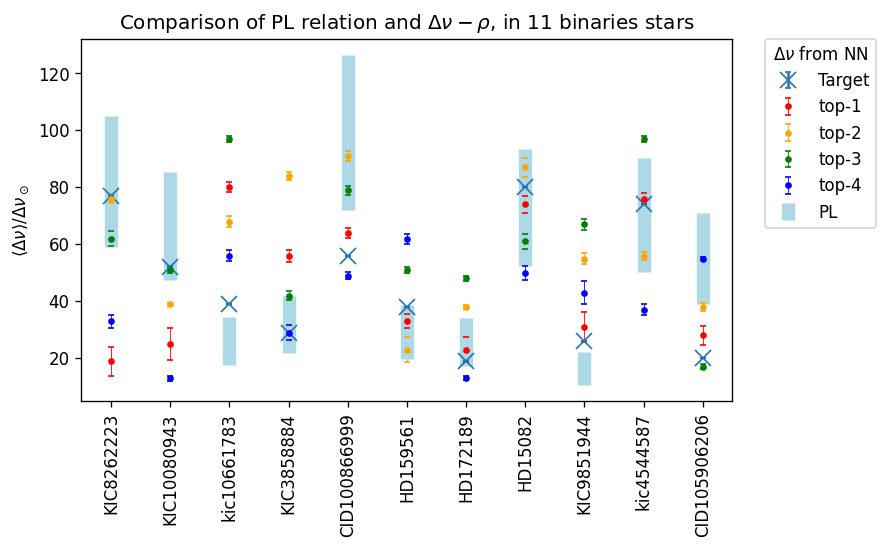

In [16]:
plt.subplots(1, figsize=(7, 4), dpi=120)

plt.errorbar(
    df["id"],
    df["dnu-target"],
    0,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)

plt.errorbar(
    df["id"],
    df["top1"],
    df["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)
plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
plt.errorbar(
    df["id"],
    df["top4"],
    df["e-top4"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="blue",
    label="top-4",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 11 binaries stars")
#plt.ylim(0, 1.0)
plt.show()

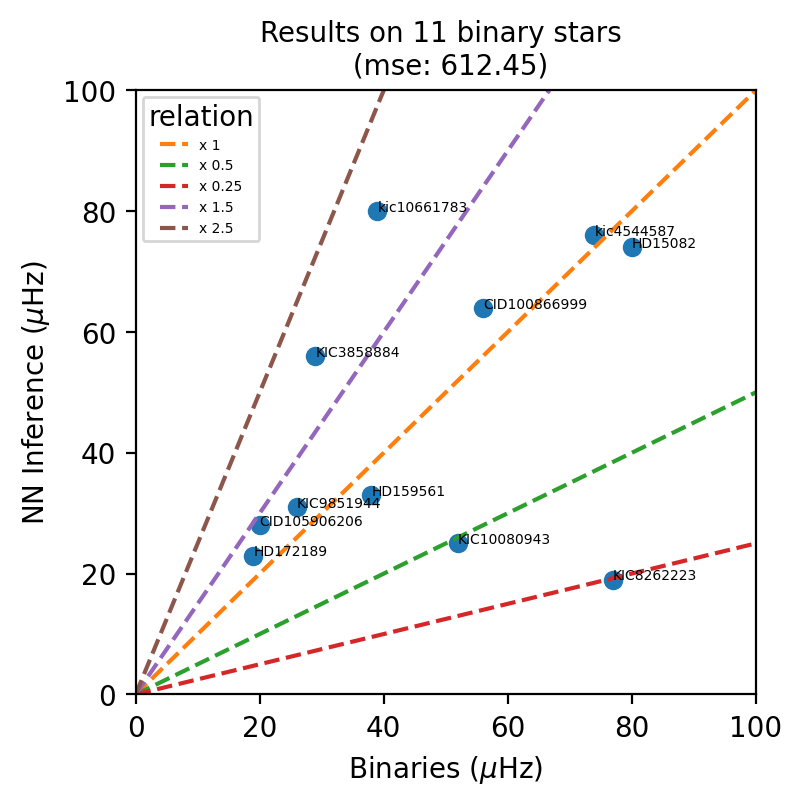

In [17]:
# Prepare data plot
targets = []
inferences = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    
# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(1.5, 0)
abline(2.5, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("Binaries ($\mu$Hz)")
plt.ylabel("NN Inference ($\mu$Hz)")
plt.title("Results on 11 binary stars \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)), 2), fontsize=10)
plt.show()
plt.show()

In [18]:
results_binaries = pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "e-dnu-target",
        "dnu-from-P",
        "e-dnu-from-P",
        "best-top",
        "e-best-top",
        "ktop",
    ]
)

for index, row in df.iterrows():
    print("Proccessing star %s" % row["id"])
    print("PL[%f,%f]" % (row["dnu-from-P-up"], row["dnu-from-P-down"]))
    # Top index to search on 
    top_indexs = ["top1", "top2", "top3"]
    best = np.nan # empty on start
    # Center of PL window
    central_pl_window = row["dnu-from-P-up"]-((row["dnu-from-P-up"]-row["dnu-from-P-down"])/2)
    # Check predictions indise L window
    inside_pl_window = []
    for top_index in top_indexs:
        flag_full_inside = (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"]) & (row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"])
        flag_partial =  ((row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] - row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) | ((row[top_index] + row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) 
        if flag_full_inside or flag_partial:
            inside_pl_window.append(top_index)
    print("   =>Inside PL window: %s" % inside_pl_window)

    if (len(inside_pl_window) > 0) and (not np.isnan(row["dnu-from-P-up"])):
        print("=>",inside_pl_window)
        top_index = inside_pl_window[0] # Get most probable from NN
        
        # Get best
        best = row["%s" % (top_index)]
        results_binaries.loc[len(results_binaries)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-%s" % top_index],
                        top_index
                    ]
    else:
        # Get closest inference to the center of PL window
        top_index = np.argmin([np.abs(row[top_index]-central_pl_window) for top_index in top_indexs])
        # Check if predictions is not inside window
        # Get best
        best = row["top%s" % (top_index+1)]
        results_binaries.loc[len(results_binaries)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-top%s" % (top_index+1)],
                        top_index
                    ]

Proccessing star KIC8262223
PL[104.970838,59.080258]
   =>Inside PL window: ['top2', 'top3']
=> ['top2', 'top3']
Proccessing star KIC10080943
PL[85.316430,47.322315]
   =>Inside PL window: ['top3']
=> ['top3']
Proccessing star kic10661783
PL[34.545158,17.603175]
   =>Inside PL window: []
Proccessing star KIC3858884
PL[41.985046,21.843379]
   =>Inside PL window: ['top3']
=> ['top3']
Proccessing star CID100866999
PL[126.330451,71.900529]
   =>Inside PL window: ['top2', 'top3']
=> ['top2', 'top3']
Proccessing star HD159561
PL[38.537790,19.870672]
   =>Inside PL window: ['top1', 'top2']
=> ['top1', 'top2']
Proccessing star HD172189
PL[34.079468,17.340043]
   =>Inside PL window: ['top1']
=> ['top1']
Proccessing star HD15082
PL[93.569327,52.252186]
   =>Inside PL window: ['top1', 'top2', 'top3']
=> ['top1', 'top2', 'top3']
Proccessing star KIC9851944
PL[22.013591,10.647775]
   =>Inside PL window: []
Proccessing star kic4544587
PL[90.413084,50.365296]
   =>Inside PL window: ['top1', 'top2']
=

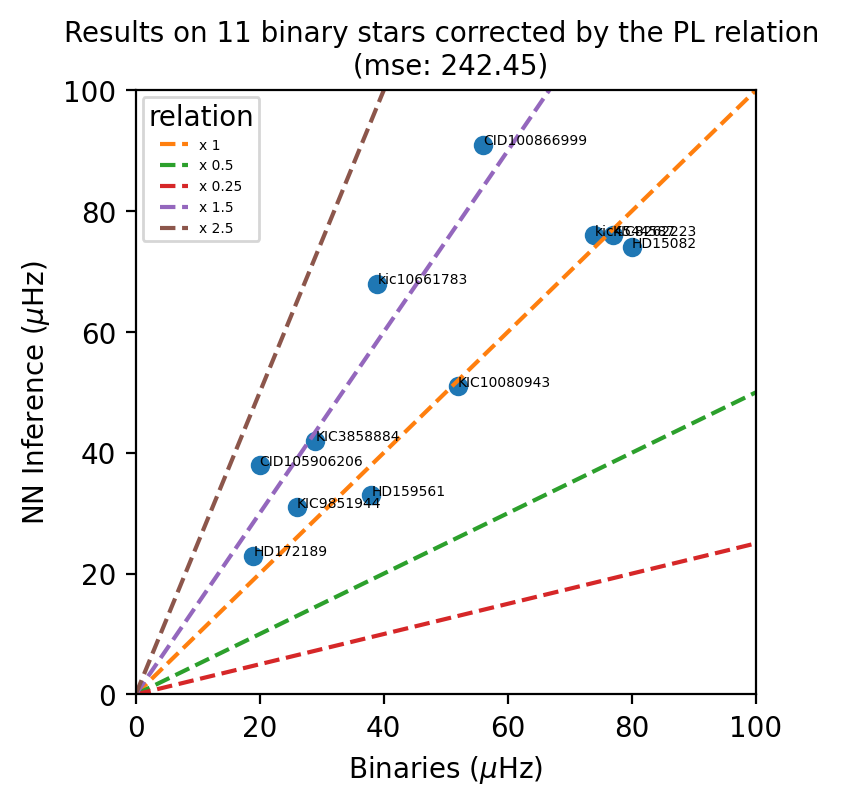

In [19]:
# Prepare data plot
targets = results_binaries["dnu-target"]
inferences = results_binaries["best-top"]
ids = results_binaries["id"]

# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(1.5, 0)
abline(2.5, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("Binaries ($\mu$Hz)")
plt.ylabel("NN Inference ($\mu$Hz)")
plt.title("Results on 11 binary stars corrected by the PL relation \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)), 2), fontsize=10)
plt.show()

## Read and process Bedding stars 

In [20]:
# Read datasets of preprocessed stars
bedding_stars = bedding()
df_bedding = bedding_stars.load("../data/bedding/preprocessed/*", batch_size=1)

Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert
Please report this to the TensorFlow team. When filing the bug, set the verbosity to 10 (on Linux, `export AUTOGRAPH_VERBOSITY=10`) and attach the full output.
Cause: 'arguments' object has no attribute 'posonlyargs'
To silence this warning, decorate the function with @tf.autograph.experimental.do_not_convert


#### Read L from file

In [21]:
"""
df_att = pd.io.parsers.read_csv("../data/bedding/bedding.csv", sep=",", index_col=0)
rows = []
for i,row in pd.io.parsers.read_csv("../data/bedding/parameters.csv", sep=",", header=1, names=["star", "L", "Teff", "dnu"]).iterrows():
    print(row)
    L = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["L"].values[0]
    Teff = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["Teff"].values[0]
    rows.append([row["star"], L, Teff, row["dnu"]])
df_aux = pd.DataFrame(rows, columns = ['star', 'L', "Teff", "dnu"])  
print(df_aux.head(57))
df_aux.to_csv("../data/bedding/parameters.csv", index=False, header=True)
"""

'\ndf_att = pd.io.parsers.read_csv("../data/bedding/bedding.csv", sep=",", index_col=0)\nrows = []\nfor i,row in pd.io.parsers.read_csv("../data/bedding/parameters.csv", sep=",", header=1, names=["star", "L", "Teff", "dnu"]).iterrows():\n    print(row)\n    L = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["L"].values[0]\n    Teff = df_att[df_att.TIC.eq(str(int(row["star"].split("-")[2])))]["Teff"].values[0]\n    rows.append([row["star"], L, Teff, row["dnu"]])\ndf_aux = pd.DataFrame(rows, columns = [\'star\', \'L\', "Teff", "dnu"])  \nprint(df_aux.head(57))\ndf_aux.to_csv("../data/bedding/parameters.csv", index=False, header=True)\n'

In [22]:
df_att = pd.io.parsers.read_csv("../data/bedding/bedding.csv", sep=",", index_col=0)
df_att

,HD,Name,TIC,V,Teff,L,e.L.,rho,e.rho.,Dnu,eps,vsini,e.vsini.,F0
1,2280.0,NaN,281499618,9.13,7510.0,5.52,0.26,0.49,0.06,7.17,1.73,26.4,1.3,19.5741
2,3622.0,NaN,43363194,7.77,7930.0,7.86,0.35,0.45,0.06,6.89,1.61,50.0,6.0,17.9829
3,10779.0,NaN,229139161,8.78,7730.0,8.13,0.36,0.39,0.05,6.80,1.63,91.0,5.0,17.8840
4,10961.0,NaN,231014033,9.39,7430.0,NaN,NaN,NaN,NaN,7.30,1.70,33.0,3.0,19.7100
5,17341.0,NaN,122615966,9.32,7810.0,10.05,0.50,0.32,0.05,5.90,1.73,14.0,1.0,16.1070
6,17693.0,NaN,122686610,7.80,7880.0,10.21,0.44,0.33,0.04,6.41,1.61,NaN,NaN,16.7301
7,20203.0,NaN,274038922,8.85,7970.0,8.06,0.38,0.45,0.05,7.20,1.76,40.0,25.0,19.8720
8,20232.0,NaN,159895674,6.88,8060.0,8.64,0.36,0.44,0.05,6.86,1.64,37.0,3.0,18.1104
9,24572.0,NaN,242944780,9.45,7410.0,7.25,0.36,0.35,0.05,7.20,1.58,NaN,NaN,18.5760
10,24975.0,NaN,44645679,7.24,7790.0,9.20,0.39,0.35,0.04,6.23,1.58,88.0,4.0,16.0734


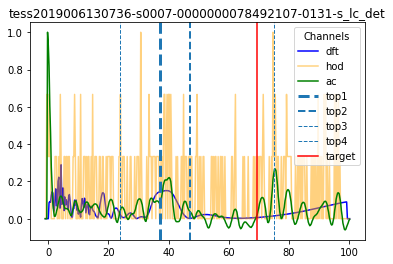

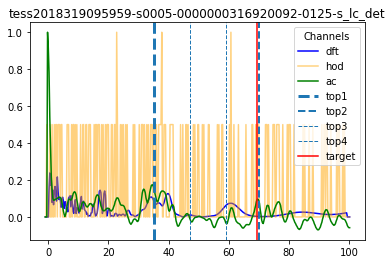

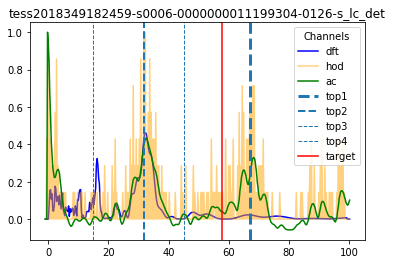

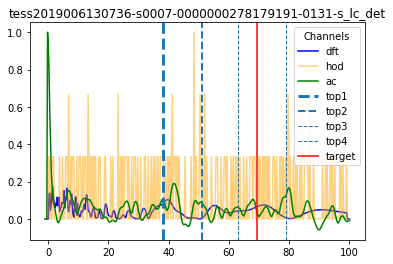

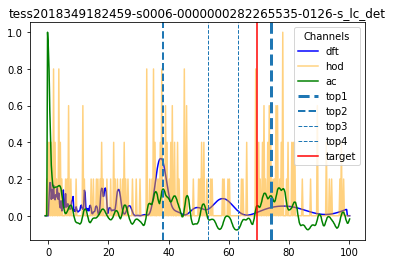

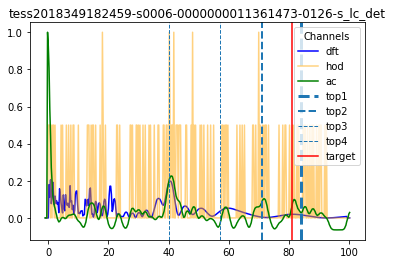

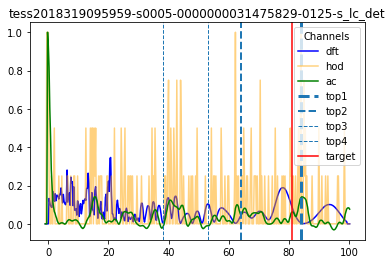

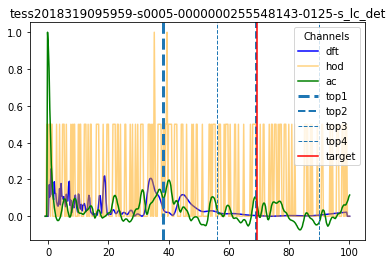

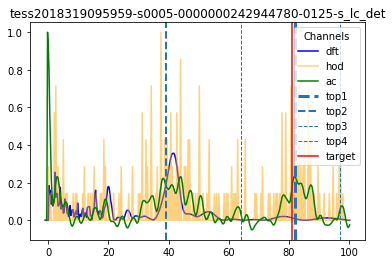

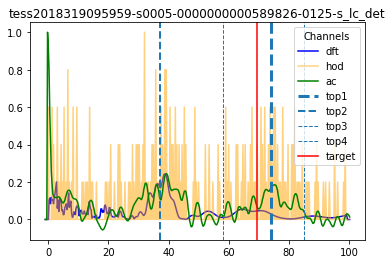

tess2018319095959-s0005-0000000306773428-0125-s_lc_det
[nan]


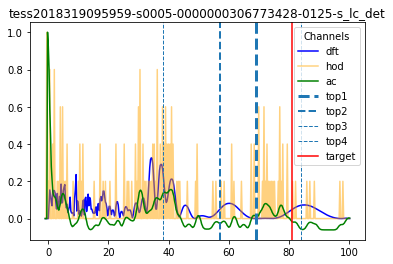

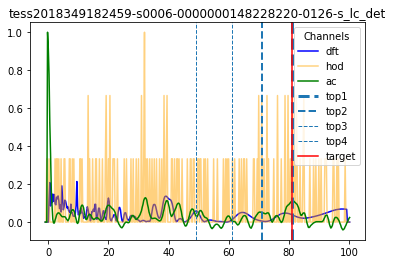

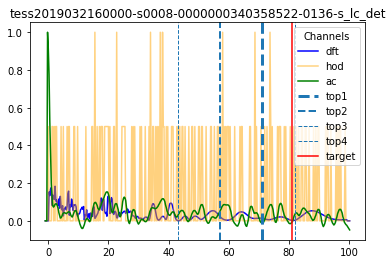

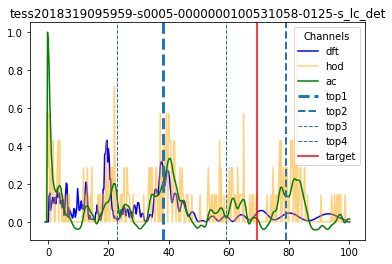

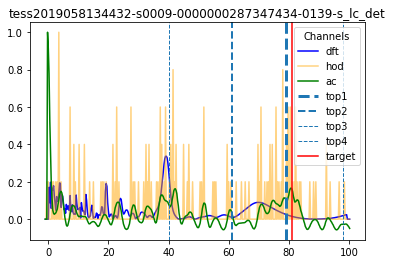

tess2019032160000-s0008-0000000176400189-0136-s_lc_det
[nan]


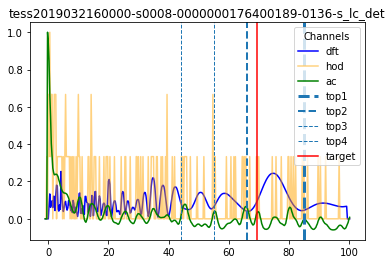

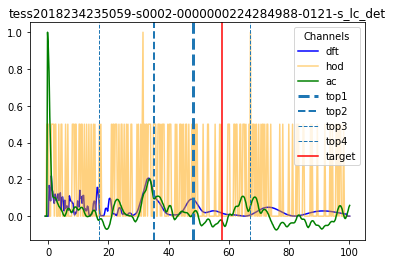

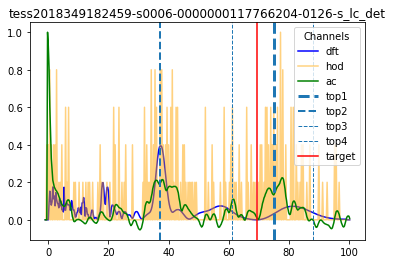

tess2019058134432-s0009-0000000463556278-0139-s_lc_det
[nan]


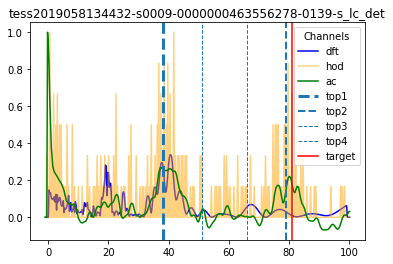

tess2018319095959-s0005-0000000459942890-0125-s_lc_det
[nan]


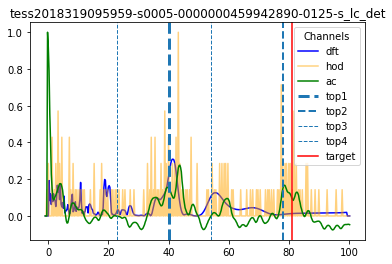

tess2018234235059-s0002-0000000327996759-0121-s_lc_det
[nan]


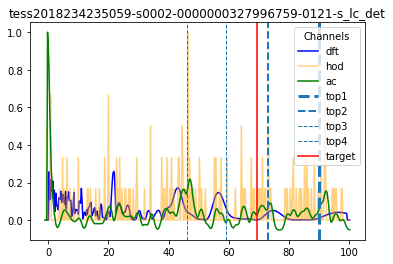

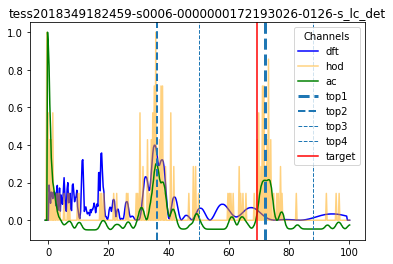

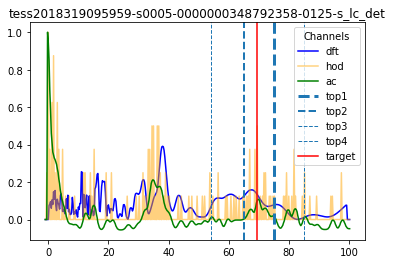

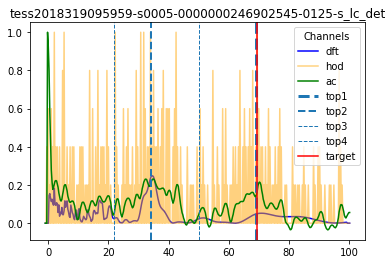

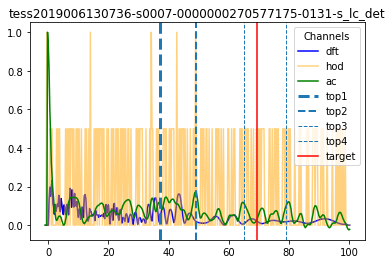

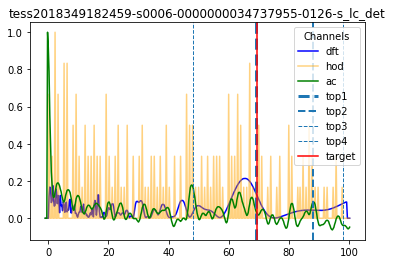

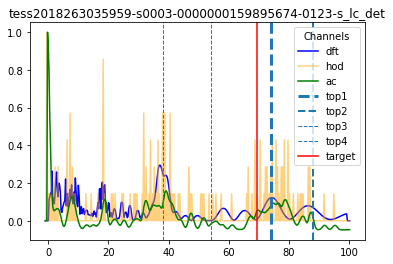

tess2018234235059-s0002-0000000316806320-0121-s_lc_det
[nan]


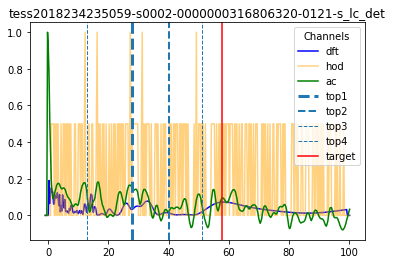

tess2019058134432-s0009-0000000388351327-0139-s_lc_det
[nan]


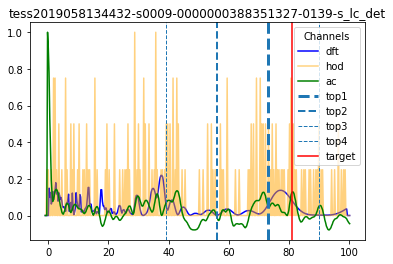

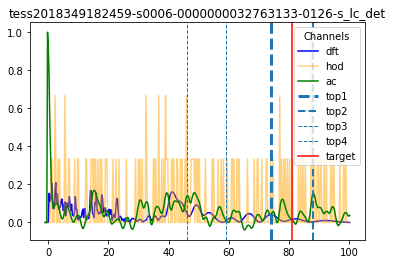

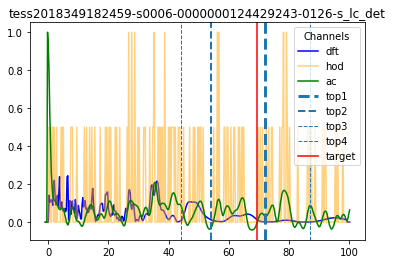

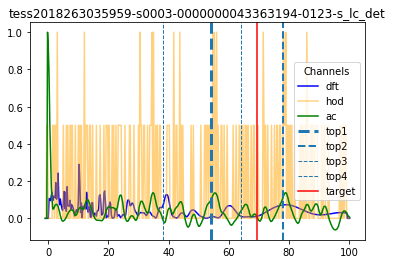

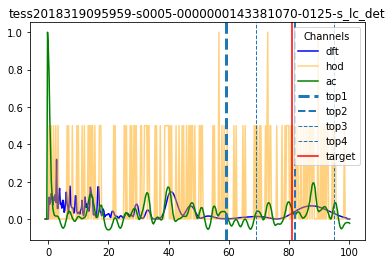

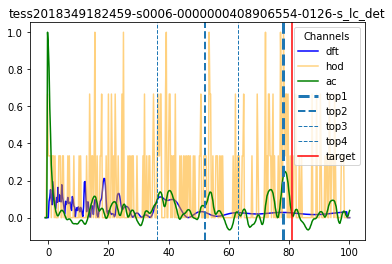

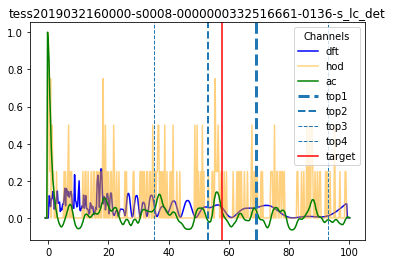

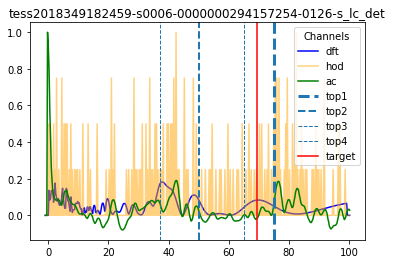

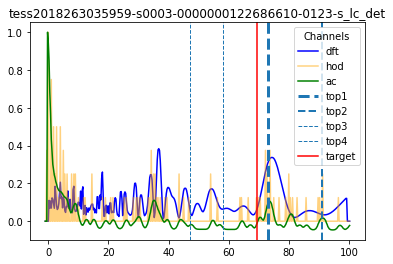

tess2018319095959-s0005-0000000024344701-0125-s_lc_det
[nan]


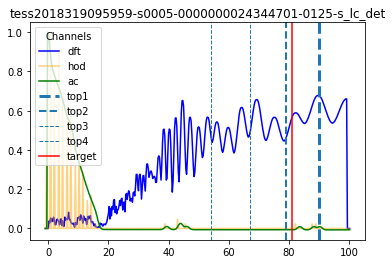

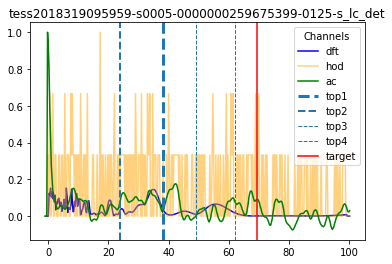

tess2018319095959-s0005-0000000009147509-0125-s_lc_det
[nan]


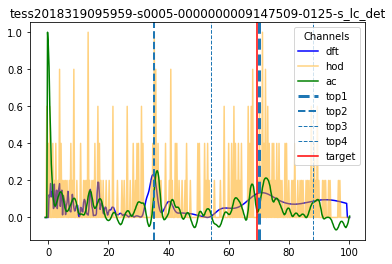

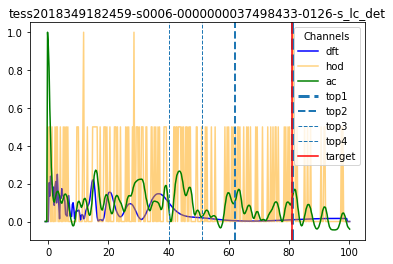

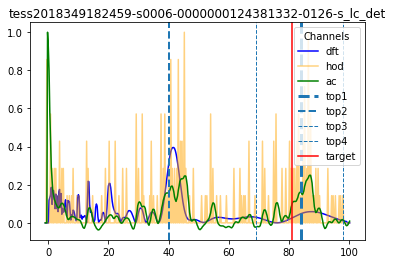

tess2018263035959-s0003-0000000231014033-0123-s_lc_det
[nan]


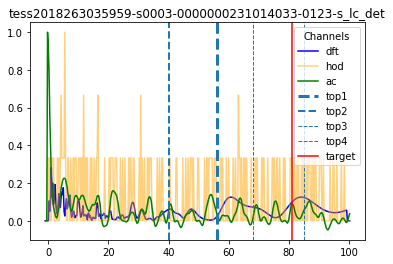

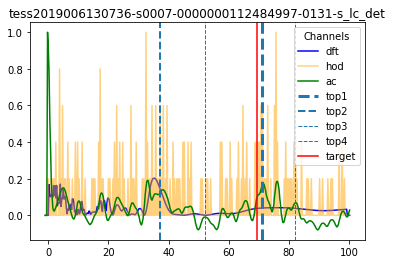

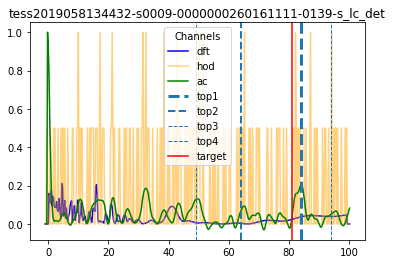

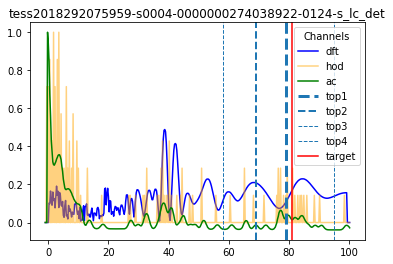

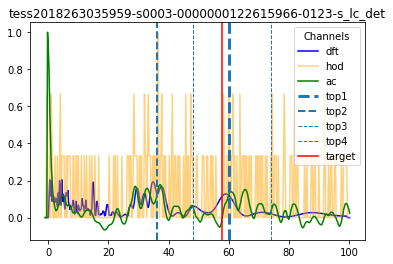

...

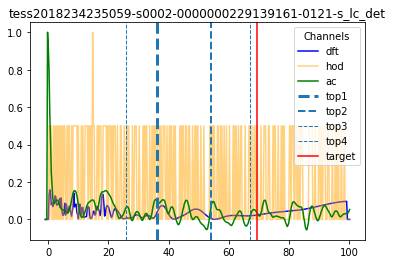

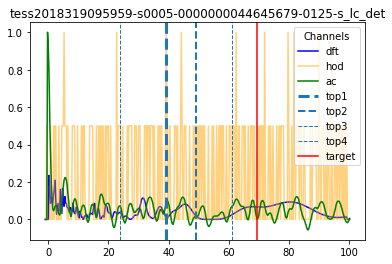

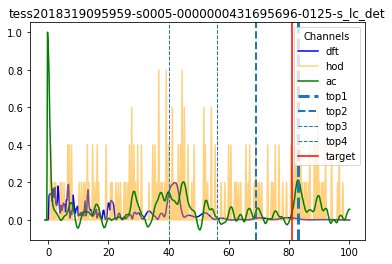

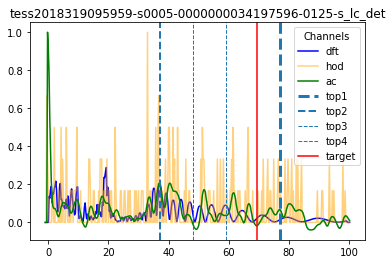

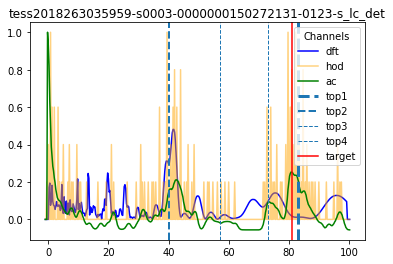

tess2019169103026-s0013-0000000269792989-0146-s_lc_det
[nan]


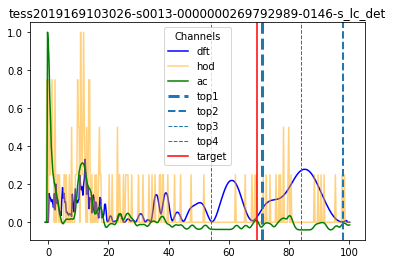

In [23]:
# Save results and predictions
results = {}
for star in df_bedding.take(57):  # take the stars
    target = np.where(star[2].numpy().flat == 1)[0].flat[0] / 0.0864
    # Save results
    if star[0].numpy()[0].decode("utf-8") not in results:
        results[star[0].numpy()[0].decode("utf-8")] = {
            "dnu-target": target,
        }

    probs = sepconv_mod.predict_proba(star[1])[0]
    peaks, _ = find_peaks(probs, height=0, distance=10)
    peaks_width = peak_widths(probs, peaks)
    peaks_sorted_by_prob = np.sort(probs[peaks])[::-1]
    best_peak, best_peak_width = get_peak_width(0, peaks, peaks_width, peaks_sorted_by_prob)

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top1"] = np.where(
        probs == peaks_sorted_by_prob[0]
    )[0][0]
    # Get error
    results[star[0].numpy()[0].decode("utf-8")]["e-top1"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top2"] = np.where(
        probs == peaks_sorted_by_prob[1]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(1, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top2"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top3"] = np.where(
        probs == peaks_sorted_by_prob[2]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(2, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top3"] = best_peak_width

    # save top-k
    results[star[0].numpy()[0].decode("utf-8")]["top4"] = np.where(
        probs == peaks_sorted_by_prob[3]
    )[0][0]
    # Get error
    best_peak, best_peak_width = get_peak_width(3, peaks, peaks_width, peaks_sorted_by_prob)
    results[star[0].numpy()[0].decode("utf-8")]["e-top4"] = best_peak_width




    L = df_att[
        df_att.TIC.eq(str(int(star[0].numpy()[0].decode("utf-8").split("-")[2])))
    ]["L"].values
    Teff = df_att[
        df_att.TIC.eq(str(int(star[0].numpy()[0].decode("utf-8").split("-")[2])))
    ]["Teff"].values
    if len(Teff) > 0 and not np.isnan(Teff):

        l_teff_topk1 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top1"], Teff]
            ).reshape(1, 2)
        )[0]
        l_teff_topk2 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top2"], Teff]
            ).reshape(1, 2)
        )[0]
        l_teff_topk3 = gam_teff_dnu.predict(
            np.asarray(
                [results[star[0].numpy()[0].decode("utf-8")]["top3"], Teff]
            ).reshape(1, 2)
        )[0]

        # Get L errors
        ls_teff_topks = [l_teff_topk1, l_teff_topk2, l_teff_topk3]
        # Get L errors
        errors = [
            round(np.power(l_teff_topk1 - L[0], 2), 2),
            round(np.power(l_teff_topk2 - L[0], 2), 2),
            round(np.power(l_teff_topk3 - L[0], 2), 2)
        ]
        i = np.argmin(errors)  # Get min error position
        L = ls_teff_topks[i]  # Get most probable L from the model

        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)

        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-up-fromstarmodel"
        ] = get_dnu_from_rho(rho_q_up) * dnu_sun
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-down-fromstarmodel"
        ] = get_dnu_from_rho(rho_q_down) * dnu_sun
    else:
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-up-fromstarmodel"
        ] = np.nan
        results[star[0].numpy()[0].decode("utf-8")][
            "dnu-from-P-down-fromstarmodel"
        ] = np.nan


    # Get L from Teff,Dnu model
    L = df_att[
        df_att.TIC.eq(str(int(star[0].numpy()[0].decode("utf-8").split("-")[2])))
    ]["L"].values
    if len(L) > 0 and not np.isnan(L):
        P = get_P(np.log10(L))
        p_e = p_error(log_L=np.log10(L))
        rho_q_up = get_rho_from_P(P - p_e, Q=0.042)
        rho_q_down = get_rho_from_P(P + p_e, Q=0.033)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = get_dnu_from_rho(rho_q_up[0]) * dnu_sun
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-down"] = get_dnu_from_rho(rho_q_down[0]) * dnu_sun
    else:
        print(star[0].numpy()[0].decode("utf-8"))
        print(L)
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-up"] = np.nan
        results[star[0].numpy()[0].decode("utf-8")]["dnu-from-P-down"] = np.nan


    if True:
        x = np.arange(-1, 100.5, 0.25)  # x axis from 0 to 100
        plt.plot(x, star[1][0, :, 0], label="dft", color="blue")
        plt.plot(x, star[1][0, :, 1], label="hod", color="orange", alpha=0.5)
        plt.plot(x, star[1][0, :, 2], label="ac", color="green")
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top1"], label="top1", linestyle="dashed", linewidth = 3)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top2"], label="top2", linestyle="dashed", linewidth = 2)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top3"], label="top3", linestyle="dashed", linewidth = 1)
        plt.axvline(x=results[star[0].numpy()[0].decode("utf-8")]["top4"], label="top4", linestyle="dashed", linewidth = 1)
        plt.axvline(x=target, label="target", color="red")
        plt.title(star[0].numpy()[0].decode("utf-8"))
        plt.legend(title="Channels")
        plt.show()


In [24]:
df = pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "top1",
        "e-top1",
        "top2",
        "e-top2",
        "top3",
        "e-top3",
        "top4",
        "e-top4",
        "dnu-from-P-up-fromstarmodel",
        "dnu-from-P-down-fromstarmodel",
        "dnu-from-P-up",
        "dnu-from-P-down"

    ]
)
for i, id in enumerate(results):
    df.loc[i] = [
        id,
        results[id]["dnu-target"],
        results[id]["top1"],
        results[id]["e-top1"],
        results[id]["top2"],
        results[id]["e-top2"],
        results[id]["top3"],
        results[id]["e-top3"],
        results[id]["top4"],
        results[id]["e-top4"],
        results[id]["dnu-from-P-up-fromstarmodel"],
        results[id]["dnu-from-P-down-fromstarmodel"],
        results[id]["dnu-from-P-up"],
        results[id]["dnu-from-P-down"]
    ]
df

,id,dnu-target,top1,e-top1,top2,e-top2,top3,e-top3,top4,e-top4,dnu-from-P-up-fromstarmodel,dnu-from-P-down-fromstarmodel,dnu-from-P-up,dnu-from-P-down
0,tess2019006130736-s0007-0000000078492107-0131-...,69.444444,37,3.324844,47,0.548734,75,1.401048,24,1.029066,75.938166,41.738921,72.388692,39.632407
1,tess2018319095959-s0005-0000000316920092-0125-...,69.444444,35,4.239941,70,2.758474,47,1.691071,59,0.766334,73.723102,40.423851,80.599917,44.511417
2,tess2018349182459-s0006-0000000011199304-0126-...,57.870370,67,1.856491,32,2.403015,45,1.979635,15,1.298821,44.338329,23.197060,45.222192,23.706833
3,tess2019006130736-s0007-0000000278179191-0131-...,69.444444,38,1.856177,51,5.350561,63,2.029423,79,3.277625,77.745800,42.813237,93.471066,52.193418
4,tess2018349182459-s0006-0000000282265535-0126-...,69.444444,74,2.734564,38,1.592465,53,2.391621,63,1.258000,54.822353,29.284557,65.960827,35.829308
5,tess2018349182459-s0006-0000000011361473-0126-...,81.018519,84,1.499811,71,2.820142,40,2.366492,57,2.116441,51.612330,27.411909,57.243144,30.701178
6,tess2018319095959-s0005-0000000031475829-0125-...,81.018519,84,1.656333,64,1.423709,38,1.148517,53,1.744523,61.013118,32.914082,77.786247,42.837287
7,tess2018319095959-s0005-0000000255548143-0125-...,69.444444,38,1.573915,69,2.704329,56,2.043386,90,1.156430,75.945142,41.743066,80.068831,44.195255
8,tess2018319095959-s0005-0000000242944780-0125-...,81.018519,82,1.881459,39,2.770581,64,2.755975,97,0.924758,80.742358,44.596226,84.063471,46.575071
9,tess2018319095959-s0005-0000000000589826-0125-...,69.444444,74,2.478041,37,3.050673,58,3.106564,85,0.683434,72.053841,39.433902,76.355029,41.986584


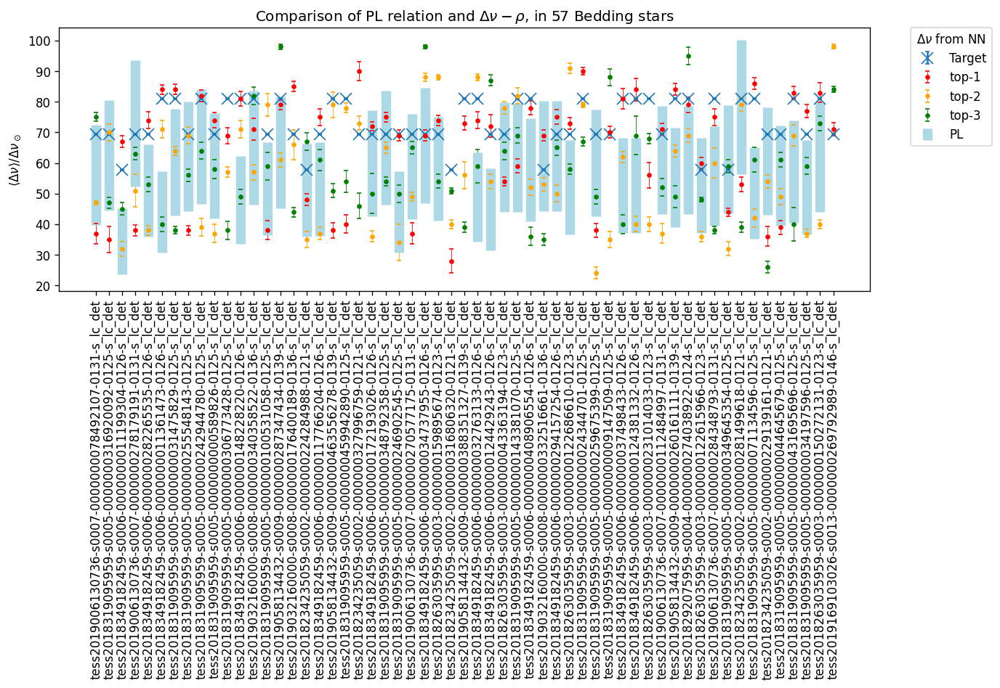

57


In [25]:
plt.subplots(1, figsize=(12, 4), dpi=120)

plt.errorbar(
    df["id"],
    df["dnu-target"],
    0.23,
    fmt="x",
    markersize=10,
    capsize=2,
    label="Target"
)

plt.errorbar(
    df["id"],
    df["top1"],
    df["e-top1"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="red",
    label="top-1",
)
plt.errorbar(
    df["id"],
    df["top2"],
    df["e-top2"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="orange",
    label="top-2",
)
plt.errorbar(
    df["id"],
    df["top3"],
    df["e-top3"],
    elinewidth=0.5,
    markersize=3,
    capsize=2,
    fmt="o",
    color="green",
    label="top-3",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2,
    df["dnu-from-P-up-fromstarmodel"] - ((df["dnu-from-P-up-fromstarmodel"] + df["dnu-from-P-down-fromstarmodel"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=10,
    label="PL-From Teff",
    color="blue",
)
"""
plt.errorbar(
    df["id"],
    (df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2,
    df["dnu-from-P-up"] - ((df["dnu-from-P-up"] + df["dnu-from-P-down"]) / 2),
    elinewidth=8,
    fmt="o",
    markersize=0,
    capsize=0,
    label="PL",
    color="lightblue",
)

plt.xticks(rotation=90)

plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    title=r"$\Delta\nu$ from NN",
)
#plt.gca().add_artist(legend1)
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$")
plt.title("Comparison of PL relation and $\Delta\\nu-\\rho$, in 57 Bedding stars")
#plt.ylim(0, 1.0)
plt.show()
print(len(df.index))

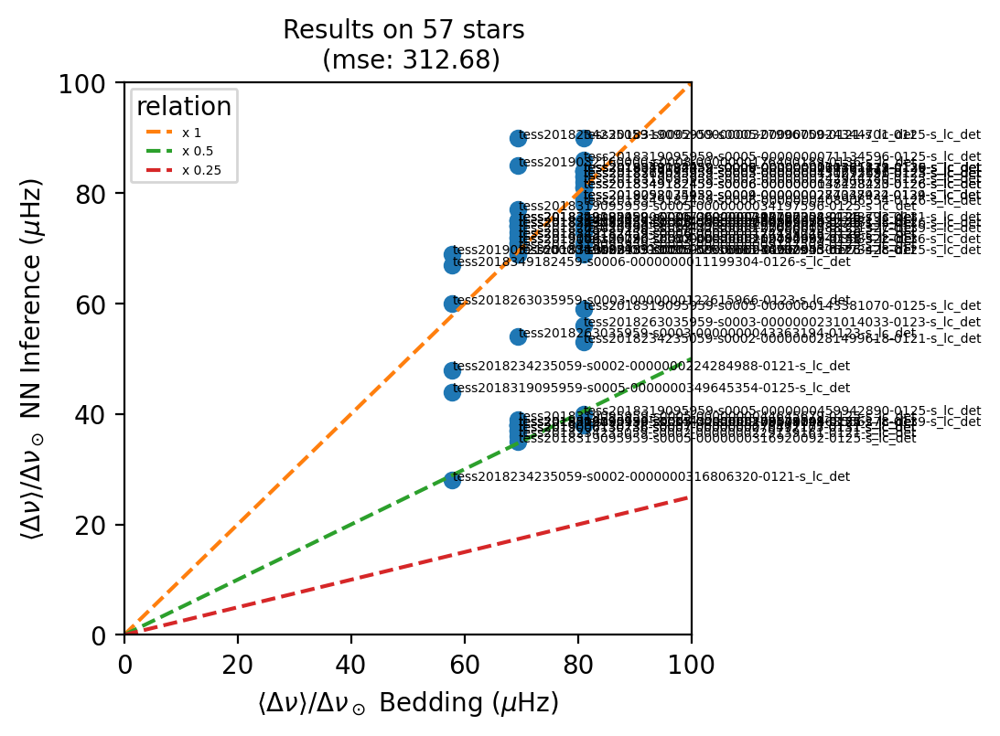

In [26]:
# Prepare data plot
targets = []
inferences = []
ids = []
for tess_id in results:
    ids.append(tess_id)
    targets.append(results[tess_id]["dnu-target"])
    inferences.append(results[tess_id]["top1"])
    
# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ Bedding ($\mu$Hz)")
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ NN Inference ($\mu$Hz)")
plt.title("Results on 57 stars \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)),2), fontsize=10)
plt.show()

In [27]:
results_bedding= pd.DataFrame(
    columns=[
        "id",
        "dnu-target",
        "e-dnu-target",
        "dnu-from-P",
        "e-dnu-from-P",
        "best-top",
        "e-best-top",
        "ktop",
    ]
)

for index, row in df.iterrows():
    print("Proccessing star %s" % row["id"])
    print("PL[%f,%f]" % (row["dnu-from-P-up"], row["dnu-from-P-down"]))
    # Top index to search on 
    top_indexs = ["top1", "top2", "top3"]
    best = np.nan # empty on start
    # Center of PL window
    central_pl_window = row["dnu-from-P-up"]-((row["dnu-from-P-up"]-row["dnu-from-P-down"])/2)
    # Check predictions indise L window
    inside_pl_window = []
    for top_index in top_indexs:
        flag_full_inside = (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"]) & (row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"])
        flag_partial =  ((row[top_index] - row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] - row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) | ((row[top_index] + row["e-%s" % (top_index)] >= row["dnu-from-P-down"]) & (row[top_index] + row["e-%s" % (top_index)] <= row["dnu-from-P-up"])) 
        if flag_full_inside or flag_partial:
            inside_pl_window.append(top_index)
    print("   =>Inside PL window: %s" % inside_pl_window)

    if (len(inside_pl_window) > 0) and (not np.isnan(row["dnu-from-P-up"])):
        print("=>",inside_pl_window)
        top_index = inside_pl_window[0] # Get most probable from NN
        
        # Get best
        best = row["%s" % (top_index)]
        results_bedding.loc[len(results_bedding)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-%s" % top_index],
                        top_index
                    ]
    else:
        # Get closest inference to the center of PL window
        top_index = np.argmin([np.abs(row[top_index]-central_pl_window) for top_index in top_indexs])
        # Check if predictions is not inside window
        # Get best
        best = row["top%s" % (top_index+1)]
        results_bedding.loc[len(results_bedding)] = [
                        row["id"],
                        row["dnu-target"],
                        0.23,
                        (row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2,
                        row["dnu-from-P-up"] - ((row["dnu-from-P-up"] + row["dnu-from-P-down"]) / 2),
                        best,
                        row["e-top%s" % (top_index+1)],
                        top_index
                    ]

Proccessing star tess2019006130736-s0007-0000000078492107-0131-s_lc_det
PL[72.388692,39.632407]
   =>Inside PL window: ['top1', 'top2']
=> ['top1', 'top2']
Proccessing star tess2018319095959-s0005-0000000316920092-0125-s_lc_det
PL[80.599917,44.511417]
   =>Inside PL window: ['top2', 'top3']
=> ['top2', 'top3']
Proccessing star tess2018349182459-s0006-0000000011199304-0126-s_lc_det
PL[45.222192,23.706833]
   =>Inside PL window: ['top2', 'top3']
=> ['top2', 'top3']
Proccessing star tess2019006130736-s0007-0000000278179191-0131-s_lc_det
PL[93.471066,52.193418]
   =>Inside PL window: ['top2', 'top3']
=> ['top2', 'top3']
Proccessing star tess2018349182459-s0006-0000000282265535-0126-s_lc_det
PL[65.960827,35.829308]
   =>Inside PL window: ['top2', 'top3']
=> ['top2', 'top3']
Proccessing star tess2018349182459-s0006-0000000011361473-0126-s_lc_det
PL[57.243144,30.701178]
   =>Inside PL window: ['top3']
=> ['top3']
Proccessing star tess2018319095959-s0005-0000000031475829-0125-s_lc_det
PL[77.78

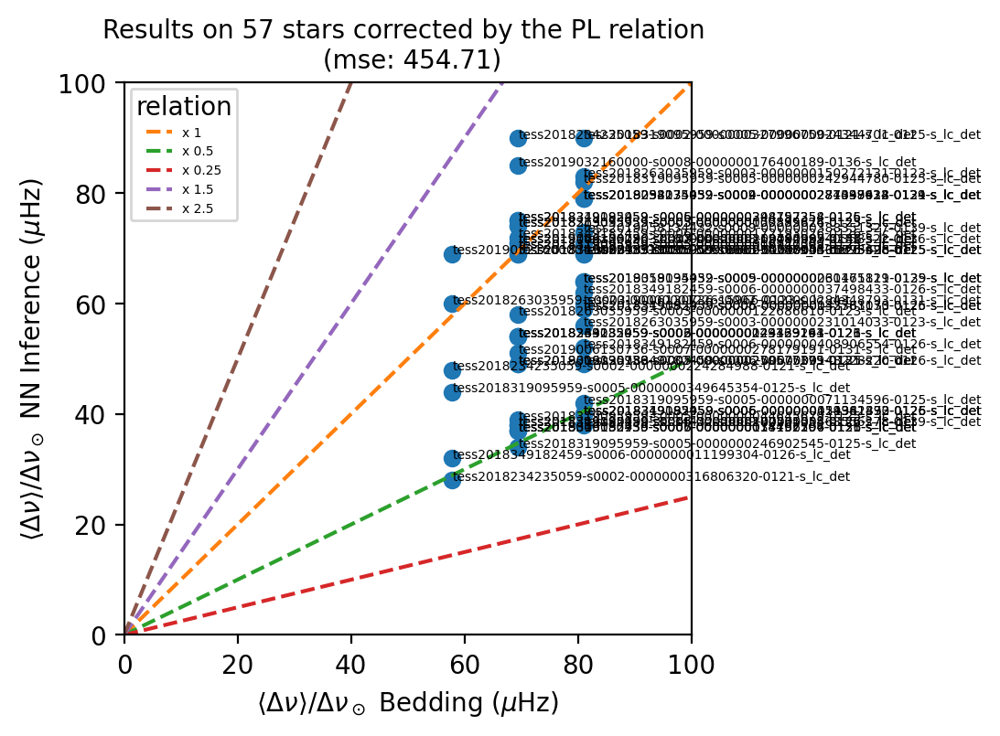

In [28]:
# Prepare data plot
targets = results_bedding["dnu-target"]
inferences = results_bedding["best-top"]
ids = results_bedding["id"]

# Set lims
plt.subplots(1, figsize=(4, 4), dpi=200)
plt.xlim(0, 100)
plt.ylim(0, 100)
plt.plot(targets, inferences, "o") # Plot relation
for i, txt in enumerate(ids):
    plt.annotate(txt, (targets[i], inferences[i]), size=5)

# Add multiple and submultiples
abline(1, 0)
abline(0.5, 0)
abline(0.25, 0)
abline(1.5, 0)
abline(2.5, 0)
plt.legend(title="relation", fontsize=5)
plt.xlabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ Bedding ($\mu$Hz)")
plt.ylabel("$\langle\Delta\\nu\\rangle / \Delta\\nu_\odot$ NN Inference ($\mu$Hz)")
plt.title("Results on 57 stars corrected by the PL relation \n (mse: %s)" % np.round(np.mean(np.power(np.asarray(targets)-np.asarray(inferences), 2)),2), fontsize=10)
plt.show()